# **27. Stable Diffusion, 너 Do? 나 Do! [프로젝트]**


| # | 평가문항 | 이 노트북에서의 달성 방법 |
|-|-|-|
| 1 | 잠재적 표현의 변화가 모델 출력에 미치는 영향을 관찰하였는가? | **1** 프롬프트 2개의 텍스트 임베딩을 선형 보간하여 이미지를 생성하고, 변화되는 특성을 분석 |
| 2 | Stable diffusion 모델의 dreambooth 미세조정을 실습하였는가? | **2** Instance / Class 이미지를 저장 → 학습 → 대상 이미지 생성 |
| 3 | 나만의 취향이 담긴 생성 이미지를 만들어보았는가? | **3** Checkpoint + LoRA를 받아 파이프라인 구축 → 이미지 생성 |

### 전체 실행 흐름

```
[0. 환경 준비]  cu128 torch 확인(RTX 5070 Ti, sm_120) → 공통 헬퍼 함수 정의
      │
      ▼
[1. Latent 탐사]  SD v1-4 (fp16)
      ├─ 1-1 프롬프트 2개 임베딩 선형 보간 → 5단계 그리드 · 30프레임 GIF · 프레임 변화량 그래프
      ├─ 1-2 프롬프트 4개 2차원 보간 → 노이즈 고정 vs 비고정 6×6 그리드
      └─ 1-3 분석 : 변화는 계단식, 초기 노이즈 = 구도 / 텍스트 = 내용·화풍
      │  free_gpu()
      ▼
[2. DreamBooth]  토끼 인형 6장
      ├─ 2-1 instance_raw → 회전 보정·정사각 크롭·512px → instance/
      ├─ 2-2 train_dreambooth.py (accelerate, fp16 · 8bit Adam · grad checkpointing)
      │       └─ class 이미지 100장 자동 생성 → prior preservation 학습 (v1: 2e-6 · 400 step)
      ├─ 2-3 원본 SD vs DreamBooth (같은 노이즈) · language drift 확인
      ├─ 2-4 분석 : 과소적합 (나비넥타이만 학습)
      └─ 2-5~2-7 재학습 v2 (5e-6 · 800 step) → 대상 재현 4/4, drift 감소, 약한 과적합
      │  free_gpu()
      ▼
[3. Checkpoint + LoRA]
      ├─ 3-1 SD v1-4 vs Checkpoint(hellofantasytime) → 화풍의 바탕
      ├─ 3-2 코기 LoRA 적용 전후 · scale 0 ~ 1.2 → 0.3 ~ 0.6 이 균형점
      ├─ 3-3 자유 생성 : hellofantasytime + GL0W LoRA 0.4 → 밤의 숲 호수 (최종 seed 1)
      └─ 3-4 분석
      ▼
[4. 디버깅 기록 · 회고]
```

## **0. 환경 준비**

In [1]:
import os

os.environ["HF_HUB_DISABLE_SYMLINKS_WARNING"] = "1"

import torch
import diffusers
import transformers
import peft
import bitsandbytes

props = torch.cuda.get_device_properties(0)
print(f"torch        : {torch.__version__} (CUDA {torch.version.cuda})")
print(f"GPU          : {props.name} / {props.total_memory / 2**30:.1f} GB / sm_{props.major}{props.minor}")
print(f"diffusers    : {diffusers.__version__}")
print(f"transformers : {transformers.__version__}")

W0922 06:40:09.403000 8272 site-packages\torch\utils\flop_counter.py:29] triton not found; flop counting will not work for triton kernels


torch        : 2.11.0+cu128 (CUDA 12.8)
GPU          : NVIDIA GeForce RTX 5070 Ti Laptop GPU / 11.9 GB / sm_120
diffusers    : 0.41.0.dev0
transformers : 5.17.0


In [2]:
import gc
import math
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Image as IPyImage, display
from PIL import Image
from tqdm.auto import tqdm

device = "cuda"
DTYPE = torch.float16          # 12GB VRAM → 반정밀도로 메모리/속도 절약
SEED = 12345
LATENT_SHAPE = (4, 512 // 8, 512 // 8)   # VAE가 512x512 이미지를 1/8로 줄인 잠재 공간 (C, H, W)

plt.rcParams["font.family"] = "Malgun Gothic"   # Windows 한글 폰트
plt.rcParams["axes.unicode_minus"] = False

OUT_DIR = Path("./outputs")
OUT_DIR.mkdir(exist_ok=True)

In [3]:
def free_gpu(*names):
    """전역 변수(파이프라인 등)를 지우고 GPU 캐시를 비운다. 섹션 사이 VRAM 확보용."""
    for name in names:
        globals().pop(name, None)
    gc.collect()
    torch.cuda.empty_cache()
    print(f"GPU 사용 중 메모리: {torch.cuda.memory_allocated() / 2**30:.2f} GB")


def show_grid(images, cols, titles=None, scale=2.5, save_path=None):
    """PIL 이미지 리스트를 cols 열 그리드로 표시한다."""
    rows = math.ceil(len(images) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * scale, rows * scale), squeeze=False)
    for i, ax in enumerate(axes.flat):
        ax.axis("off")
        if i < len(images):
            ax.imshow(images[i])
            if titles is not None:
                ax.set_title(titles[i], fontsize=9)
    plt.subplots_adjust(wspace=0.02, hspace=0.15 if titles else 0.02)
    if save_path:
        fig.savefig(save_path, bbox_inches="tight", dpi=80)
    plt.show()


def export_as_gif(path, images, fps=10, rubber_band=False):
    """PIL 이미지 리스트를 GIF로 저장한다.
    rubber_band=True 이면 끝까지 갔다가 되돌아오는 왕복 애니메이션으로 만든다.
    (강의 코드는 images += ... 로 원본 리스트를 변형했으므로 새 리스트를 만든다)"""
    frames = images + images[-2:0:-1] if rubber_band else images
    frames[0].save(path, save_all=True, append_images=frames[1:],
                   duration=1000 // fps, loop=0)


@torch.no_grad()
def encode_prompt(pipe, text):
    """텍스트 → CLIP 텍스트 인코더의 마지막 hidden state (77, 768).
    SD v1은 77 토큰으로 패딩/절단된 문장 전체의 토큰별 임베딩을 조건으로 쓴다."""
    tokens = pipe.tokenizer(text, padding="max_length", truncation=True,
                            max_length=pipe.tokenizer.model_max_length, return_tensors="pt")
    return pipe.text_encoder(tokens.input_ids.to(device))[0][0]


def lerp(a, b, n):
    """a → b 를 n 단계로 선형 보간. a, b 와 같은 shape 앞에 n 차원이 추가된다.
    a, b 가 이미 (m, ...) 모양이면 결과는 (n, m, ...) → 2차원(4-way) 보간에도 재사용."""
    w = torch.linspace(0, 1, n, device=a.device, dtype=a.dtype).view(-1, *[1] * a.dim())
    return (1 - w) * a + w * b


def make_noise(n, seed=SEED):
    """시드를 고정한 초기 잠재 노이즈 (n, 4, 64, 64)."""
    g = torch.Generator(device=device).manual_seed(seed)
    return torch.randn((n, *LATENT_SHAPE), generator=g, device=device, dtype=DTYPE)


def generate(pipe, embeds, latents, batch_size=3, steps=25, guidance=7.5):
    """텍스트 임베딩(N, 77, 768)과 초기 노이즈(N, 4, 64, 64)를 짝지어 배치 단위로 이미지 생성.
    프롬프트 문자열 대신 prompt_embeds 를 직접 넣어야 '문장 사이'의 임베딩을 조건으로 줄 수 있다."""
    images = []
    for i in tqdm(range(0, len(embeds), batch_size), desc="generate"):
        out = pipe(prompt_embeds=embeds[i:i + batch_size].to(DTYPE),
                   latents=latents[i:i + batch_size],
                   num_inference_steps=steps, guidance_scale=guidance)
        images += out.images
    return images

## **1. Latent**

Stable Diffusion(LDM)은 두 종류의 잠재 공간을 사용한다.

- **이미지 잠재 공간** — VAE 인코더가 512×512×3 이미지를 64×64×4 로 압축한 공간. U-Net은 여기서 노이즈를 제거.
- **텍스트(프롬프트) 잠재 공간** — CLIP 텍스트 인코더가 만든 (77, 768) 임베딩. U-Net의 cross-attention 조건으로 들어감.

모델은 `CompVis/stable-diffusion-v1-4` 를 사용한다.

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

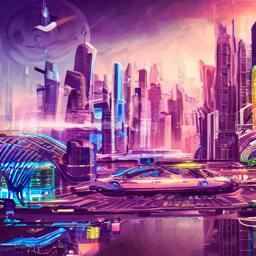

In [31]:
from diffusers import StableDiffusionPipeline

MODEL_ID = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_ID,
    dtype=DTYPE,
    safety_checker=None,           # 보간 중간 이미지가 검은 화면으로 오탐되는 것 방지
    requires_safety_checker=False,
).to(device)
pipe.set_progress_bar_config(disable=True)   # 배치마다 뜨는 진행바 대신 generate()의 tqdm 하나만 사용

# 동작 확인용 1장
image = pipe("A futuristic cityscape, vibrant and detailed",
             generator=torch.Generator(device).manual_seed(SEED)).images[0]
image.resize((256, 256))

### **1-1. 프롬프트 2개 사이 보간하기**

두 문장을 각각 임베딩으로 바꾼 뒤, 그 사이를 선형 보간한다.
초기 노이즈는 모든 단계에서 동일하게 고정하여, 이미지 변화가 오직 텍스트 임베딩 변화에서만 오도록 통제한다.

encoding_1 shape : (77, 768)
두 임베딩의 L2 거리 : 296.99
interpolated_encodings shape : (5, 77, 768)


generate:   0%|          | 0/2 [00:00<?, ?it/s]

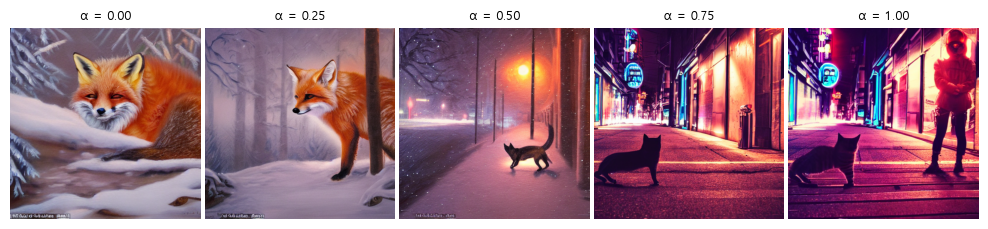

In [32]:
prompt_1 = "An oil painting of a red fox sleeping in a snowy forest at dawn"
prompt_2 = "A cyberpunk photo of a cat on a city street at night"

encoding_1 = encode_prompt(pipe, prompt_1)
encoding_2 = encode_prompt(pipe, prompt_2)
print(f"encoding_1 shape : {tuple(encoding_1.shape)}")   # (토큰 77개, 임베딩 768차원)
print(f"두 임베딩의 L2 거리 : {(encoding_1 - encoding_2).float().norm():.2f}")

interpolation_steps = 5
interpolated_encodings = lerp(encoding_1, encoding_2, interpolation_steps)
print(f"interpolated_encodings shape : {tuple(interpolated_encodings.shape)}")

# 같은 노이즈 1개를 steps 개로 복제 → 모든 이미지가 같은 출발점에서 디노이징
noise = make_noise(1).repeat(interpolation_steps, 1, 1, 1)

images_5 = generate(pipe, interpolated_encodings, noise)
alphas = torch.linspace(0, 1, interpolation_steps).tolist()
show_grid(images_5, cols=5, titles=[f"α = {a:.2f}" for a in alphas],
          save_path=OUT_DIR / "1-1_interp_5.jpg")

**30단계**로 잘게 나눠 GIF로 만들고 연속 프레임 사이의 픽셀 변화량을 그려 "변화가 몰리는 구간"을 수치로 확인한다.


generate:   0%|          | 0/10 [00:00<?, ?it/s]

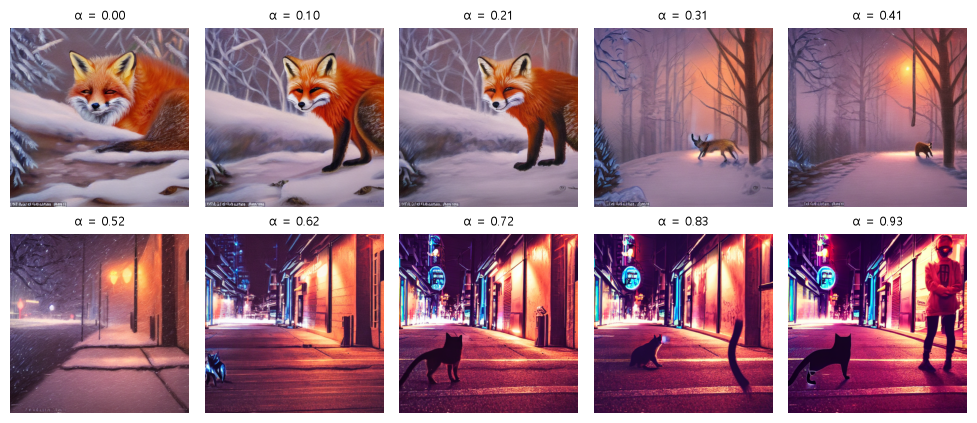

In [33]:
interpolation_steps = 30
interpolated_encodings = lerp(encoding_1, encoding_2, interpolation_steps)
noise = make_noise(1).repeat(interpolation_steps, 1, 1, 1)

images_30 = generate(pipe, interpolated_encodings, noise)

gif_path = OUT_DIR / "1-1_doggo-and-fruit-30.gif"
export_as_gif(gif_path, images_30, fps=8, rubber_band=True)

# 3프레임 간격으로 정지 이미지 그리드 저장
show_grid(images_30[::3], cols=5,
          titles=[f"α = {i / (interpolation_steps - 1):.2f}" for i in range(0, interpolation_steps, 3)],
          save_path=OUT_DIR / "1-1_interp_30_grid.jpg")

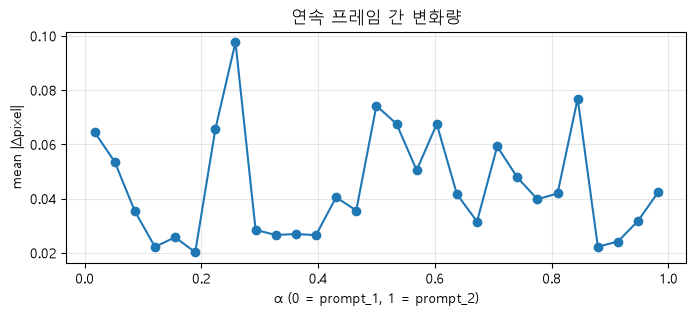

급변 구간: α 0.24 → 0.28  (Δ = 0.098)
급변 구간: α 0.48 → 0.52  (Δ = 0.074)
급변 구간: α 0.83 → 0.86  (Δ = 0.077)


In [10]:
# 연속 프레임 간 평균 절대 픽셀 차이: 값이 튀는 구간 = 이미지가 급변하는 α 구간
frames = np.stack([np.asarray(img, dtype=np.float32) / 255 for img in images_30])
frame_diff = np.abs(np.diff(frames, axis=0)).mean(axis=(1, 2, 3))
alpha_mid = (np.arange(len(frame_diff)) + 0.5) / (interpolation_steps - 1)

plt.figure(figsize=(8, 3))
plt.plot(alpha_mid, frame_diff, marker="o")
plt.xlabel("α (0 = prompt_1, 1 = prompt_2)")
plt.ylabel("mean |Δpixel|")
plt.title("연속 프레임 간 변화량")
plt.grid(alpha=0.3)
plt.savefig(OUT_DIR / "1-1_frame_diff.jpg", bbox_inches="tight", dpi=80)
plt.show()

top = np.argsort(frame_diff)[::-1][:3]
for i in sorted(top):
    print(f"급변 구간: α {i / (interpolation_steps - 1):.2f} → {(i + 1) / (interpolation_steps - 1):.2f}"
          f"  (Δ = {frame_diff[i]:.3f})")

### **1-2. 프롬프트 4개로 2차원 보간하기**

- 가로(위 행): prompt_1 → prompt_2, 가로(아래 행): prompt_3 → prompt_4
- 세로: 위 행 → 아래 행

grid_encodings shape : (36, 77, 768)


generate:   0%|          | 0/12 [00:00<?, ?it/s]

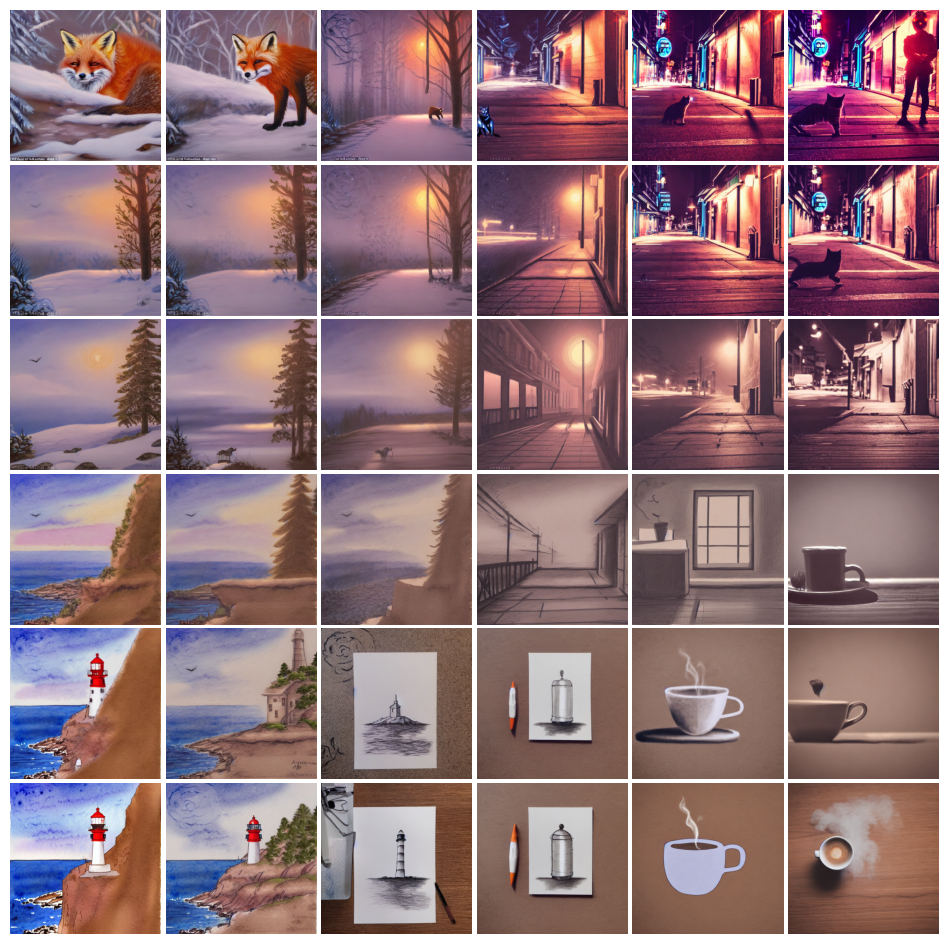

In [11]:
prompt_3 = "An anime style watercolor illustration of a lighthouse on a cliff by the sea"
prompt_4 = "A minimalist pencil sketch of a steaming cup of coffee on a wooden table"

encoding_3 = encode_prompt(pipe, prompt_3)
encoding_4 = encode_prompt(pipe, prompt_4)

grid_n = 6
top_row = lerp(encoding_1, encoding_2, grid_n)       # (6, 77, 768)
bottom_row = lerp(encoding_3, encoding_4, grid_n)    # (6, 77, 768)
grid_encodings = lerp(top_row, bottom_row, grid_n).reshape(grid_n**2, 77, 768)
print(f"grid_encodings shape : {tuple(grid_encodings.shape)}")

# 노이즈 고정: 36장 모두 같은 초기 노이즈
fixed_noise = make_noise(1).repeat(grid_n**2, 1, 1, 1)
images_grid_fixed = generate(pipe, grid_encodings, fixed_noise)
show_grid(images_grid_fixed, cols=grid_n, scale=2, save_path=OUT_DIR / "1-2_4way_fixed_noise.jpg")

노이즈를 고정하지 않은 버전. 

generate:   0%|          | 0/12 [00:00<?, ?it/s]

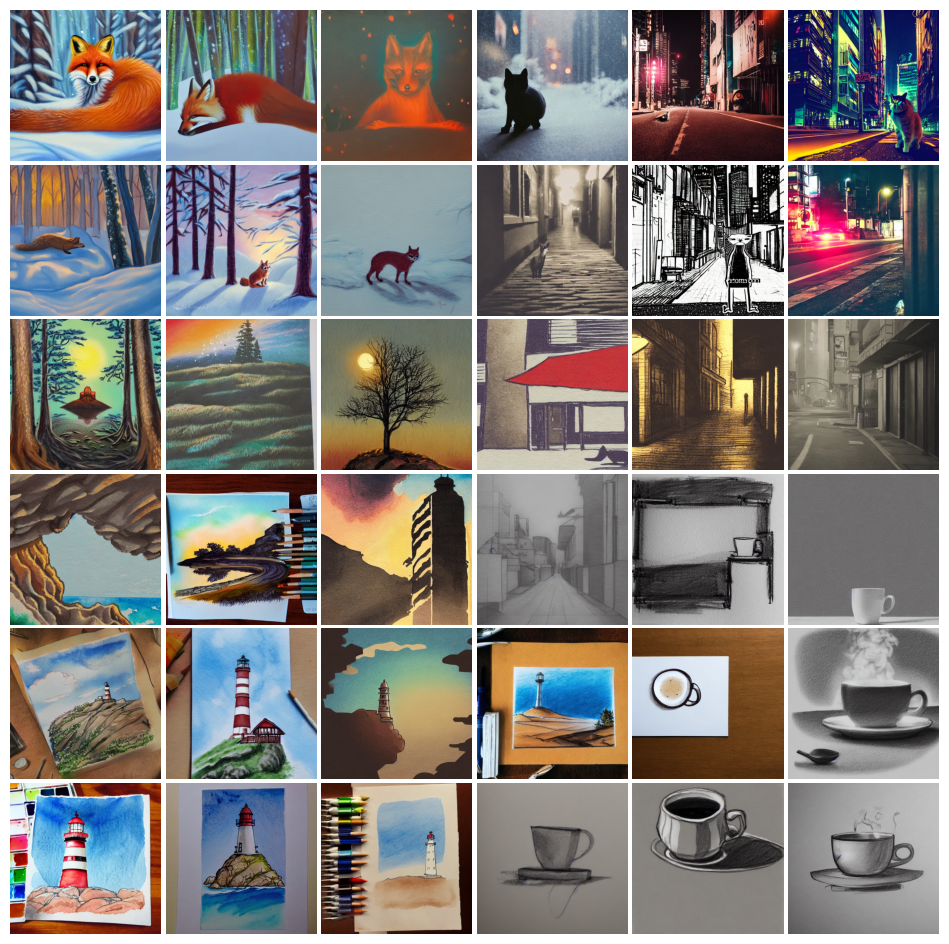

In [12]:
# 노이즈 고정 X: 36장 각각 다른 초기 노이즈
varying_noise = make_noise(grid_n**2, seed=SEED + 1)
images_grid_varying = generate(pipe, grid_encodings, varying_noise)
show_grid(images_grid_varying, cols=grid_n, scale=2, save_path=OUT_DIR / "1-2_4way_varying_noise.jpg")

### **1-3. 관찰 · 분석 기록**

- prompt_1 : `An oil painting of a red fox sleeping in a snowy forest at dawn`
- prompt_2 : `A cyberpunk photo of a cat on a city street at night`

**프롬프트 2개 보간 (1-1, 초기 노이즈 고정)**

| 관찰 항목 | 결과 |
|-|-|
| 주 피사체 (여우 → 고양이) | α 0 ~ 0.21 은 여우가 화면을 채움(α 0.10 부터 누운 자세 → 선 자세). **α 0.24 → 0.28 에서 여우가 멀리 작은 동물로 축소**되고, α 0.41 ~ 0.52 에서는 **피사체가 거의 사라짐**. 고양이는 α 0.62 쯤 작게 등장해 α 0.72 부터 뚜렷한 검은 고양이 실루엣이 됨. 중간에 "여우-고양이 합성체"는 나오지 않았음 |
| 화풍 (유화 → 사진) | α 0.21 까지는 유화 질감. α 0.31 부터 글자가 사라지고 안개 낀 사진 같은 질감으로 바뀜 → **화풍이 피사체보다 먼저, 한 번에 전환** |
| 배경 · 시간대 | 눈 덮인 숲 → (α 0.31 ~ 0.41) 가로등 같은 주황 불빛이 켜진 숲길 → (α 0.52) **눈 내리는 밤거리 = 두 프롬프트가 섞인 구간** → (α 0.62~) 네온 간판이 있는 도시 거리. 새벽빛의 주황색이 가로등 불빛으로 자연스럽게 이어짐 |
| 색감 | 흰색·주황 → 보라빛 안개 → 주황·분홍 → 마젠타·시안 네온. 밝기는 α 가 커질수록 점점 어두워짐 |
| 중간 지점 (α ≈ 0.5) | 한쪽 피사체로 쏠리지 않고 **피사체가 빠진 "배경만 있는 장면"**. 두 조건이 충돌하는 구간에서는 공통 요소만 남는 것으로 보임 |
| 프레임 변화량 그래프 | 급변 구간 **α 0.24→0.28 (Δ 0.098)**, **0.48→0.52 (Δ 0.074)**, **0.83→0.86 (Δ 0.077)**. 각각 ① 여우 클로즈업 → 원경, ② 숲 → 도시, ③ 오른쪽에 사람 실루엣 등장 에 대응. 그 사이 α 0.12~0.20, 0.30~0.40 은 Δ ≈ 0.02~0.03 으로 거의 변화 없음 → **변화는 선형이 아니라 "평탄 구간 + 계단식 점프"** |
| 모든 프레임에서 유지된 요소 | 왼쪽 아래에서 오른쪽 위 소실점으로 뻗는 **길/바닥의 대각선 구도**, 오른쪽의 **세로 구조물**(나무 기둥 → 가로등 → 건물 벽), 피사체의 위치(화면 중앙 하단) |
| 프롬프트에 없던 요소 | α 0.83 이후 오른쪽에 사람이 등장. prompt_2 에는 사람이 없지만 "cyberpunk … city street" 와 함께 학습된 이미지에 사람이 자주 있었던 것으로 추정 |

**4-way 보간 (1-2)**

| 관찰 항목 | 결과 |
|-|-|
| 노이즈 고정 그리드 — 인접 칸 연속성 | 인접 칸은 대부분 부드럽게 이어지고, 36칸 전체가 **"오른쪽 세로 구조물 + 대각선 지면" 구도를 공유**. 변화는 가운데 열(3→4열)에서 크게 일어남. 아래쪽 행에서는 등대 → 연필 스케치 속 등대 → **같은 길쭉한 실루엣의 금속 주전자** → 커피잔 순으로, 형태는 유지된 채 의미만 바뀜 |
| 노이즈 비고정 그리드 — 구도·배치 | 칸마다 구도·시점·크기가 모두 달라 인접 칸이 이어지지 않음. 그래도 **네 모서리 방향의 내용·화풍 경향**은 유지됨. 노이즈에 따라 여우가 살아남는 범위도 넓어짐 |
| 영향력이 넓게 퍼진 프롬프트 | **스타일·배경 단어가 피사체보다 넓게 퍼짐.** 여우는 좌상단 2칸에서만 보이지만 "snowy" 설경은 좌측 3행까지, 커피의 갈색은 우하단 3×3 영역까지 퍼짐. prompt_3 의 "watercolor" 는 좌하단에서, "pencil sketch" 는 종이+연필이 놓인 사진 형태로 가운데 열까지 나타남 |

**정리 — 잠재 공간 매니폴드 관점**

- **연속성**: 임베딩을 조금씩 움직이면 대부분의 구간에서 이미지도 조금씩 변함(Δ ≈ 0.02~0.04). 다만 몇몇 지점에서 급변이 일어나, 텍스트 임베딩 → 이미지의 사상은 **매끄럽지만 균일하지는 않음**.
- **보간성**: 두 프롬프트 사이의 모든 중간 임베딩이 깨지지 않은 그럴듯한 이미지를 만들었음. 단, 중간 지점은 두 개념의 평균(여우+고양이)이 아니라 **두 조건이 공유하는 요소(배경·조명·구도)가 남은 장면**으로 나타남.
- **역할 분담**: 노이즈 고정/비고정 비교에서 **초기 노이즈(이미지 잠재) = 구도·배치**, **텍스트 임베딩 = 내용·화풍·색감**을 주로 결정함을 확인.

---
## **2. DreamBooth**

**DreamBooth** 는 대상 사진 3~6장만으로 SD가 "그 대상"을 그리도록 U-Net 전체를 미세조정하는 방법이다.

- **고유 식별자(identifier)**: 기존 의미가 거의 없는 토큰 `sks` 를 대상에 묶음. → instance prompt `a photo of sks {class}`
- **문제점**: 몇 장으로 큰 모델을 학습하면 과적합(학습 사진 그대로 복사), language drift(class 단어 자체가 내 대상으로 변해버림)
- **해결 — prior preservation loss**: 모델이 학습 전에 직접 생성한 class 이미지(`a photo of {class}`)를 함께 학습시켜 class 에 대한 원래 지식을 보존.

**폴더 구조**

```
./dreambooth/
 ├─ instance_raw/   ← 원본 사진 5~6장을 넣는 곳
 ├─ instance/       ← 전처리(회전 보정·정사각 크롭·512px) 결과 → 학습 입력
 ├─ class/          ← class 이미지 100장 (학습 스크립트가 SD로 자동 생성)
 └─ model/          ← 학습된 파이프라인 (unet, text_encoder, vae ...)
```

In [10]:
free_gpu("pipe", "images_5", "images_30", "images_grid_fixed", "images_grid_varying")

from PIL import ImageOps
from diffusers import StableDiffusionPipeline

MODEL_ID = "CompVis/stable-diffusion-v1-4"   # 커널 재시작 후 1장을 건너뛰고 2장부터 실행해도 되도록 다시 정의

# accelerate 설정이 CPU 모드면 학습이 GPU를 쓰지 않고 CPU에서 몇 시간씩 돈다 (4장 디버깅 기록 참고)
ACC_CFG = Path.home() / ".cache/huggingface/accelerate/default_config.yaml"
if ACC_CFG.exists():
    cfg_text = ACC_CFG.read_text(encoding="utf-8").replace(" ", "")
    assert '"use_cpu":true' not in cfg_text and "use_cpu:true" not in cfg_text,         f"{ACC_CFG} 가 CPU 모드입니다. 파일을 지우고 `accelerate config default` 로 다시 만드세요."

DB_DIR = Path("./dreambooth")
RAW_DIR = DB_DIR / "instance_raw"
INSTANCE_DIR = DB_DIR / "instance"
CLASS_DIR = DB_DIR / "class"
MODEL_OUT = DB_DIR / "model"
for d in (RAW_DIR, INSTANCE_DIR, CLASS_DIR):
    d.mkdir(parents=True, exist_ok=True)

UNIQUE_ID = "sks"
CLASS_NAME = "Stuffed bunny"
INSTANCE_PROMPT = f"a photo of {UNIQUE_ID} {CLASS_NAME}"
CLASS_PROMPT = f"a photo of {CLASS_NAME}"
NUM_CLASS_IMAGES = 100

print("instance prompt :", INSTANCE_PROMPT)
print("class prompt    :", CLASS_PROMPT)

GPU 사용 중 메모리: 0.01 GB
instance prompt : a photo of sks Stuffed bunny
class prompt    : a photo of Stuffed bunny


### **2-1. Instance 이미지 준비**

instance 이미지 6장 → dreambooth\instance


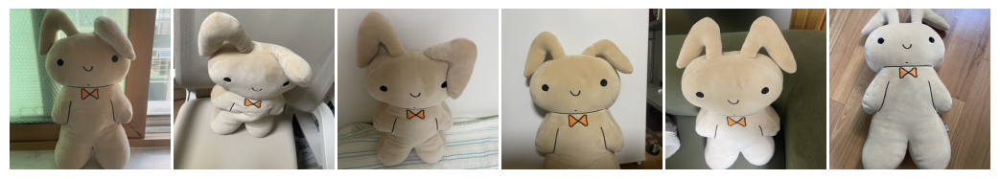

In [5]:
IMG_EXTS = {".jpg", ".jpeg", ".png"}

raw_paths = sorted(p for p in RAW_DIR.iterdir() if p.suffix.lower() in IMG_EXTS)

for old in INSTANCE_DIR.iterdir():     # 재실행 시 이전 전처리 결과 제거
    old.unlink()

instance_images = []
for i, p in enumerate(raw_paths):
    img = ImageOps.exif_transpose(Image.open(p)).convert("RGB")   # 폰 사진의 회전 정보 반영
    img = ImageOps.fit(img, (512, 512), Image.LANCZOS)             # 가운데 기준 정사각 크롭 + 리사이즈
    img.save(INSTANCE_DIR / f"instance_{i:02d}.png")
    instance_images.append(img)

print(f"instance 이미지 {len(instance_images)}장 → {INSTANCE_DIR}")
show_grid(instance_images, cols=len(instance_images), scale=2.2, save_path=OUT_DIR / "2-1_instance.jpg")

### **2-2. 학습 (class 이미지 생성 + DreamBooth)**

`diffusers_git/examples/dreambooth/train_dreambooth.py` 를 `accelerate` 로 실행한다.

| 인자 | 값 | 이유 |
|-|-|-|
| `--mixed_precision` | fp16 | 활성값/연산을 반정밀도로 → 메모리·속도 |
| `--use_8bit_adam` | True | Adam 상태(모멘텀 2개)를 8bit로 → 옵티마이저 메모리 약 1/4 |
| `--gradient_checkpointing` | True | 중간 활성값을 저장하지 않고 역전파 때 재계산 → 메모리 ↓, 속도 약간 ↓ |
| `--set_grads_to_none` | True | 기울기를 0으로 채우지 않고 해제 → 메모리 ↓ |
| `--learning_rate` / `--max_train_steps` | 2e-6 / 400 | HF 실험 기준 사물·동물은 낮은 lr 로 400 step 전후가 적당. 사람 얼굴은 800~1200 step 필요 |
| `--checkpointing_steps` | 100000 | 중간 체크포인트(옵티마이저 상태 포함 수 GB) 저장 끄기 |

In [8]:
import subprocess
import sys
import time

MAX_TRAIN_STEPS = 400
LEARNING_RATE = 2e-6

train_args = [
    sys.executable, "-m", "accelerate.commands.launch",
    "--num_processes=1", "--mixed_precision=fp16",
    "./diffusers_git/examples/dreambooth/train_dreambooth.py",
    f"--pretrained_model_name_or_path={MODEL_ID}",
    f"--instance_data_dir={INSTANCE_DIR}",
    f"--class_data_dir={CLASS_DIR}",
    f"--output_dir={MODEL_OUT}",
    f"--instance_prompt={INSTANCE_PROMPT}",
    f"--class_prompt={CLASS_PROMPT}",
    "--with_prior_preservation", "--prior_loss_weight=1.0",
    f"--num_class_images={NUM_CLASS_IMAGES}", "--sample_batch_size=4",
    "--resolution=512", "--train_batch_size=1", "--gradient_accumulation_steps=1",
    "--gradient_checkpointing", "--use_8bit_adam", "--set_grads_to_none",
    "--mixed_precision=fp16",
    f"--learning_rate={LEARNING_RATE}", "--lr_scheduler=constant", "--lr_warmup_steps=0",
    f"--max_train_steps={MAX_TRAIN_STEPS}", "--checkpointing_steps=100000",
    f"--seed={SEED}",
]
cmd = subprocess.list2cmdline(train_args)   # Windows 규칙에 맞게 공백 포함 인자를 따옴표 처리한 한 줄 명령
print(cmd, "\n")

start = time.time()
!{cmd}
print(f"\n소요 시간: {(time.time() - start) / 60:.1f} 분")

assert (MODEL_OUT / "model_index.json").exists(), "학습 결과가 저장되지 않았습니다. 위 로그의 에러를 확인하세요."
print("저장된 구성요소:", sorted(p.name for p in MODEL_OUT.iterdir() if p.is_dir()))

C:\Users\heeji\anaconda3\envs\AIFFEL_quest\python.exe -m accelerate.commands.launch --num_processes=1 --mixed_precision=fp16 ./diffusers_git/examples/dreambooth/train_dreambooth.py --pretrained_model_name_or_path=CompVis/stable-diffusion-v1-4 --instance_data_dir=dreambooth\instance --class_data_dir=dreambooth\class --output_dir=dreambooth\model "--instance_prompt=a photo of sks Stuffed bunny" "--class_prompt=a photo of Stuffed bunny" --with_prior_preservation --prior_loss_weight=1.0 --num_class_images=100 --sample_batch_size=4 --resolution=512 --train_batch_size=1 --gradient_accumulation_steps=1 --gradient_checkpointing --use_8bit_adam --set_grads_to_none --mixed_precision=fp16 --learning_rate=2e-06 --lr_scheduler=constant --lr_warmup_steps=0 --max_train_steps=400 --checkpointing_steps=100000 --seed=12345 


소요 시간: 13.2 분
저장된 구성요소: ['feature_extractor', 'logs', 'safety_checker', 'scheduler', 'text_encoder', 'tokenizer', 'unet', 'vae']


class 이미지 100장 → dreambooth\class


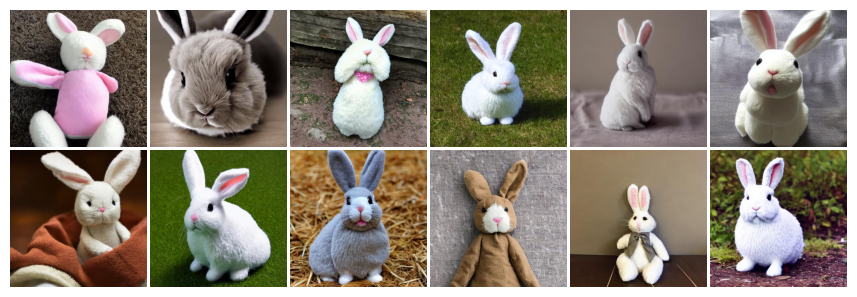

In [9]:
# 학습 스크립트가 생성해 저장한 class 이미지를 확인
class_paths = sorted(CLASS_DIR.glob("*.jpg"))
print(f"class 이미지 {len(class_paths)}장 → {CLASS_DIR}")
show_grid([Image.open(p) for p in class_paths[:12]], cols=6, scale=1.8, save_path=OUT_DIR / "2-2_class_samples.jpg")

### **2-3. 학습된 모델로 내 대상 생성하기**

`train_dreambooth.py` 는 학습된 U-Net 을 끼운 파이프라인 전체를 `MODEL_OUT` 에 저장하므로 `from_pretrained(MODEL_OUT)` 한 줄로 불러올 수 있다.
원본 SD 와 비교하기 위해 두 모델을 **같은 프롬프트 · 같은 초기 노이즈**로 생성한다.

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

GPU 사용 중 메모리: 0.01 GB


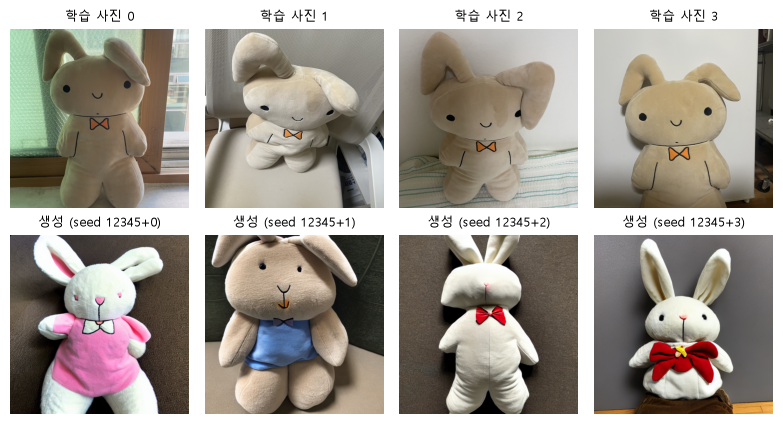

In [10]:
def sample(model_path, prompts, seed=SEED, vary_noise=False, steps=50, guidance=7.5):
    """model_path 의 SD 파이프라인으로 prompts 를 생성하고 파이프라인은 바로 내린다.
    vary_noise=False: 모든 프롬프트가 같은 초기 노이즈 (모델·프롬프트 간 공정 비교용)
    vary_noise=True : 프롬프트마다 다른 초기 노이즈 (같은 프롬프트의 다양성 확인용)"""
    sd = StableDiffusionPipeline.from_pretrained(
        model_path, dtype=DTYPE, safety_checker=None, requires_safety_checker=False
    ).to(device)
    sd.set_progress_bar_config(disable=True)
    latents = make_noise(len(prompts), seed) if vary_noise else make_noise(1, seed).repeat(len(prompts), 1, 1, 1)
    images = sd(list(prompts), latents=latents, num_inference_steps=steps, guidance_scale=guidance).images
    del sd
    free_gpu()
    return images


# 대상이 학습되었는가: instance prompt 를 서로 다른 노이즈 4개로 생성
db_instance = sample(MODEL_OUT, [INSTANCE_PROMPT] * 4, vary_noise=True)
show_grid(instance_images[:4] + db_instance, cols=4,
          titles=[f"학습 사진 {i}" for i in range(4)] + [f"생성 (seed {SEED}+{i})" for i in range(4)],
          save_path=OUT_DIR / "2-3_dreambooth_instance.jpg")

식별자 `sks` 를 넣은 다양한 문맥과, 식별자 없는 class 프롬프트(**language drift 확인용**)를 원본 SD 와 비교한다.

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

GPU 사용 중 메모리: 0.01 GB


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

GPU 사용 중 메모리: 0.01 GB


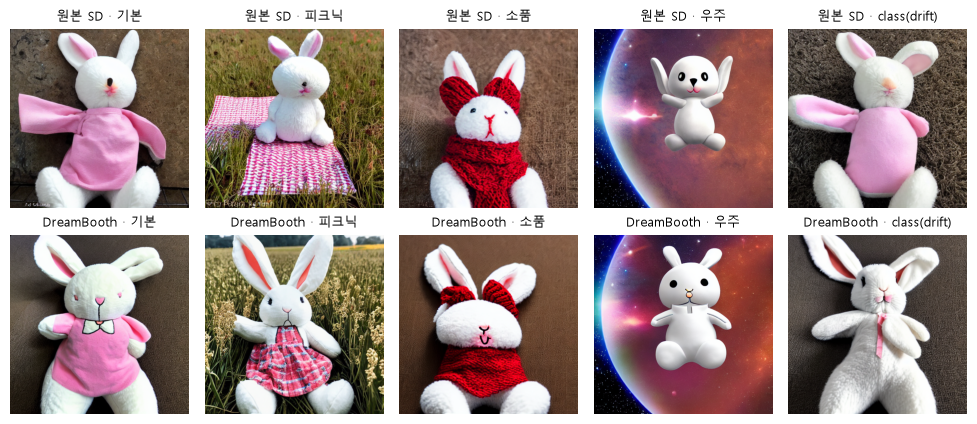

In [11]:
DB_PROMPTS = {   # 짧은 이름 : 프롬프트
    "기본": INSTANCE_PROMPT,
    "피크닉": f"a photo of {UNIQUE_ID} {CLASS_NAME} sitting on a picnic blanket in a flower field",
    "소품": f"a photo of {UNIQUE_ID} {CLASS_NAME} wearing a tiny red knitted scarf",
    "우주": f"a photo of {UNIQUE_ID} {CLASS_NAME} floating in outer space, earth in the background",
    "class(drift)": CLASS_PROMPT,
}

base_images = sample(MODEL_ID, DB_PROMPTS.values())
db_images = sample(MODEL_OUT, DB_PROMPTS.values())

show_grid(base_images + db_images, cols=len(DB_PROMPTS),
          titles=[f"원본 SD · {k}" for k in DB_PROMPTS] + [f"DreamBooth · {k}" for k in DB_PROMPTS],
          save_path=OUT_DIR / "2-3_base_vs_dreambooth.jpg")

### **2-4. DreamBooth 결과 분석**

- 대상: 직접 촬영한 **베이지색 토끼 인형** 6장 — 점 눈, 코 없이 선 하나로 된 입, **주황색 나비넥타이**, 선으로 그려진 팔, 늘어진 귀
- 설정: `a photo of sks Stuffed bunny`, lr 2e-6, 400 step, prior preservation(class 100장), 학습 6분 36초 (1.0 s/step)

| 관찰 항목 | 결과 |
|-|-|
| 대상 재현도 | **부분 재현.** 4개 시드 모두 **목의 나비넥타이**는 생겼고(흰색·빨강·파랑 옷 위), seed+1 은 베이지색 몸통·점 눈·늘어진 귀까지 학습 사진과 비슷함. 그러나 나머지 3장은 흰색/분홍색 몸통에 분홍 코가 있는 **"일반적인 토끼 인형"** 모습이고, 주황색 넥타이·선으로 된 입·선 팔 같은 세부는 재현되지 않음 |
| 문맥 반영 (피크닉·우주) | 장소는 프롬프트대로 잘 반영됨(꽃밭, 우주와 지구). 다만 이 장면들에서 대상의 특징은 거의 사라지고 원본 SD 결과와 비슷한 흰 토끼 인형이 나옴. 피크닉에서는 "picnic blanket" 의 체크무늬가 인형의 **원피스**로 바뀜 |
| 소품 (빨간 목도리) | 원본 SD 와 거의 같은 이미지 → 이 프롬프트에서는 학습 효과가 거의 보이지 않음 |
| 원본 SD 대비 차이 | 같은 노이즈라 구도는 동일하고, **목의 리본/넥타이가 추가**되는 변화가 가장 뚜렷함(기본·우주). 학습이 "대상 전체"보다 **가장 눈에 띄는 특징 1개(나비넥타이)** 위주로 먼저 들어간 것으로 보임 |
| language drift | 식별자 없는 `a photo of Stuffed bunny` 에서도 DreamBooth 쪽에만 **목에 분홍 리본**이 생김 → 약한 drift 가 있음. 다만 색·형태는 원본 SD 와 같은 흰 토끼라, prior preservation 이 class 의 전체 모습은 지켜준 것으로 보임 |
| 과적합 징후 | 학습 사진의 배경(창문·의자·나무 바닥)이나 포즈를 그대로 복사한 이미지는 없음 → 과적합보다는 **과소적합(under-fitting)** 쪽 |

**원인 추정**
1. SD 가 가진 "stuffed bunny" 의 사전 지식(흰색·분홍 코·분홍 옷, class 이미지 12장 샘플에서도 확인)이 매우 강한데, 내 인형은 그와 다른 모습(베이지·코 없음·만화풍 얼굴)이라 **lr 2e-6 · 400 step 으로는 사전 지식을 넘어서지 못함**
2. prior preservation 이 class 이미지(흰 토끼)로 계속 끌어당기면서, 적은 step 에서는 대상 쪽 학습이 약해짐
3. 텍스트 인코더는 학습하지 않아(12GB VRAM 제약) `sks` 토큰 자체의 의미가 고정됨

### **2-5. (추가 실험) 학습률 · step 을 올려 재학습**

2-4 에서 **과소적합**(나비넥타이만 학습되고 색·얼굴은 SD 의 "흰 토끼 인형" 사전 지식에 끌려감)으로 판단했으므로,
학습량을 늘려 다시 학습하고 1차 결과와 비교한다.

| | 1차 (v1) | 2차 (v2) |
|-|-|-|
| learning rate | 2e-6 | **5e-6** |
| max train steps | 400 | **800** |
| 출력 경로 | `dreambooth/model` | `dreambooth/model_v2` |

나머지 인자(prior preservation, 8bit Adam, fp16 등)와 instance / class 이미지는 동일하게 둔다.

In [12]:
import shutil

MODEL_OUT_V2 = DB_DIR / "model_v2"
V2_OVERRIDES = {"output_dir": MODEL_OUT_V2, "learning_rate": 5e-6, "max_train_steps": 800}

free_gb = shutil.disk_usage(".").free / 2**30
assert free_gb > 10, f"디스크 여유 공간이 부족합니다 ({free_gb:.0f} GB). 모델 저장에 약 5GB 가 필요합니다."

# 1차 인자에서 바꿀 3개만 빼고, 새 값을 뒤에 붙인다 (나머지 설정은 1차와 동일)
train_args_v2 = [a for a in train_args if a.split("=")[0].lstrip("-") not in V2_OVERRIDES]
train_args_v2 += [f"--{k}={v}" for k, v in V2_OVERRIDES.items()]
cmd_v2 = subprocess.list2cmdline(train_args_v2)
print(cmd_v2, "\n")

start = time.time()
!{cmd_v2}
print(f"\n소요 시간: {(time.time() - start) / 60:.1f} 분")

assert (MODEL_OUT_V2 / "model_index.json").exists(), "학습 결과가 저장되지 않았습니다. 위 로그의 에러를 확인하세요."

C:\Users\heeji\anaconda3\envs\AIFFEL_quest\python.exe -m accelerate.commands.launch --num_processes=1 --mixed_precision=fp16 ./diffusers_git/examples/dreambooth/train_dreambooth.py --pretrained_model_name_or_path=CompVis/stable-diffusion-v1-4 --instance_data_dir=dreambooth\instance --class_data_dir=dreambooth\class "--instance_prompt=a photo of sks Stuffed bunny" "--class_prompt=a photo of Stuffed bunny" --with_prior_preservation --prior_loss_weight=1.0 --num_class_images=100 --sample_batch_size=4 --resolution=512 --train_batch_size=1 --gradient_accumulation_steps=1 --gradient_checkpointing --use_8bit_adam --set_grads_to_none --mixed_precision=fp16 --lr_scheduler=constant --lr_warmup_steps=0 --checkpointing_steps=100000 --seed=12345 --output_dir=dreambooth\model_v2 --learning_rate=5e-06 --max_train_steps=800 


소요 시간: 13.2 분


### **2-6. 1차(v1) vs 2차(v2) 비교**

**대상 재현도**: 2-3 과 **같은 시드 4개**로 instance prompt 를 생성해 학습 사진과 나란히 비교한다.

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

GPU 사용 중 메모리: 0.01 GB


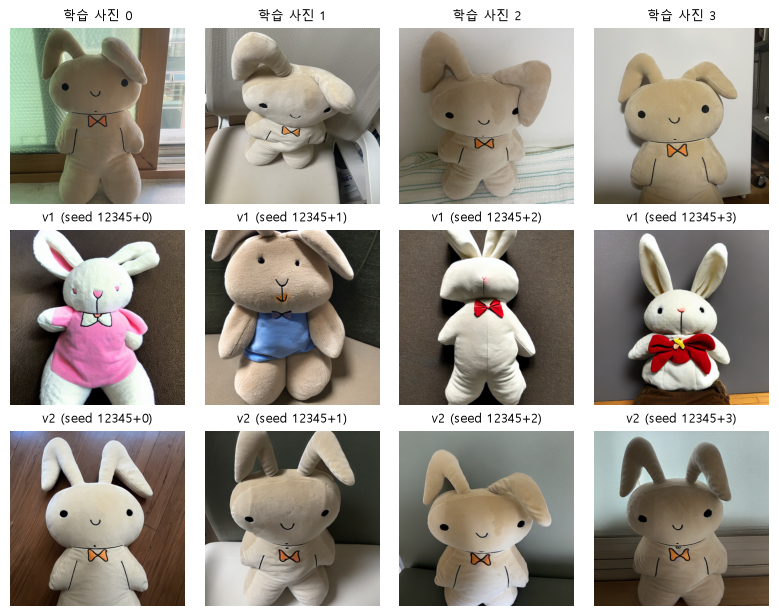

In [13]:
v2_instance = sample(MODEL_OUT_V2, [INSTANCE_PROMPT] * 4, vary_noise=True)

show_grid(instance_images[:4] + db_instance + v2_instance, cols=4,
          titles=[f"학습 사진 {i}" for i in range(4)]
          + [f"v1 (seed {SEED}+{i})" for i in range(4)]
          + [f"v2 (seed {SEED}+{i})" for i in range(4)],
          save_path=OUT_DIR / "2-6_v1_vs_v2_instance.jpg")

**문맥 · language drift**: 2-3 의 `DB_PROMPTS` 를 같은 노이즈로 생성해 **원본 SD / v1 / v2** 를 한 그리드에서 비교한다.

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

GPU 사용 중 메모리: 0.01 GB


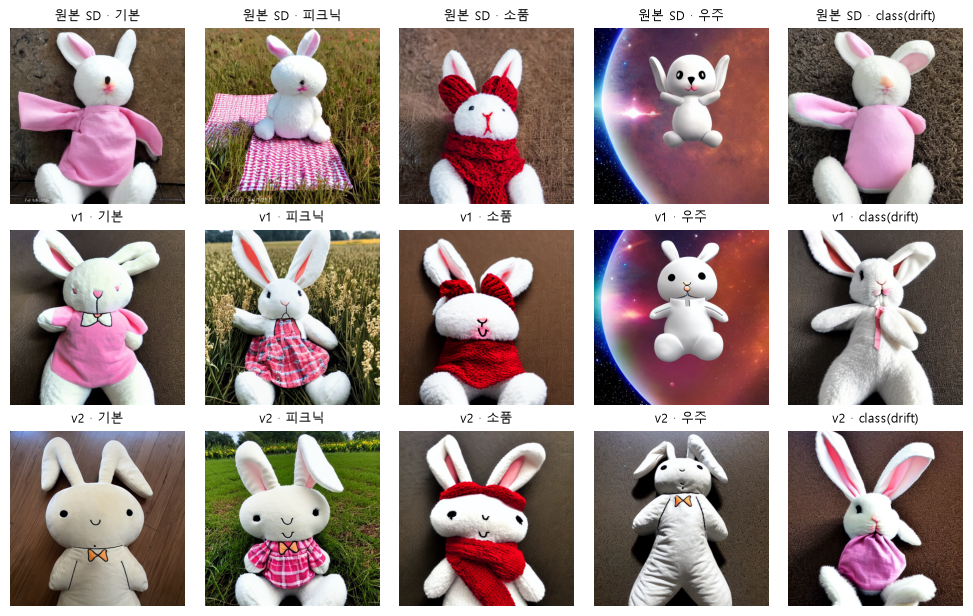

In [14]:
v2_images = sample(MODEL_OUT_V2, DB_PROMPTS.values())

show_grid(base_images + db_images + v2_images, cols=len(DB_PROMPTS),
          titles=[f"원본 SD · {k}" for k in DB_PROMPTS]
          + [f"v1 · {k}" for k in DB_PROMPTS]
          + [f"v2 · {k}" for k in DB_PROMPTS],
          save_path=OUT_DIR / "2-6_base_v1_v2.jpg")

### **2-7. 재학습 결과 분석**

- v2 학습: 800 step, 11분 59초 (1.11 it/s)


| 관찰 항목 | v1 (2e-6 · 400) | v2 (5e-6 · 800) |
|-|-|-|
| 대상 재현도 (베이지색 · 점 눈 · 선 입 · 주황 나비넥타이) | 나비넥타이 위주의 부분 재현 (4개 시드 중 1개만 비슷) | **4개 시드 모두 재현.** 베이지색 몸통, 점 눈, 선 하나로 된 입, 코 없음, **주황색** 나비넥타이, 선으로 그린 팔, 늘어진 귀까지 학습 사진과 같음 |
| 문맥 반영 (피크닉 · 우주에서 대상 유지) | 장소는 반영, 대상 특징은 거의 사라짐 | **피크닉**: 꽃밭 배경에 내 인형의 얼굴(점 눈·선 입)과 나비넥타이가 유지됨. 단 몸통은 흰색, 귀 안쪽은 분홍색으로 SD 의 사전 지식이 섞였고, "picnic blanket" 은 v1 처럼 체크무늬 **원피스**로 바뀜. **우주**: 인형은 가장 정확히 재현됐지만 **우주 배경이 사라지고** 회색 바닥에 누운 사진이 됨 → 프롬프트의 문맥을 무시 |
| 소품 (빨간 목도리) | 원본 SD 와 거의 같음 | 빨간 니트 모자·목도리를 두른 채 **내 인형의 얼굴(점 눈·선 입)** 이 나타남 → 소품 추가와 대상 유지가 함께 성공. 몸통 색은 흰색 |
| language drift (`a photo of Stuffed bunny`) | 목에 분홍 리본 — 약한 drift | **drift 가 커지지 않음.** 흰 몸통·분홍 귀의 일반적인 토끼 인형이고 베이지색·나비넥타이가 없음. v1 에 있던 목 리본도 사라짐 → 학습량을 늘려도 prior preservation 이 class 지식을 지켜줌 |
| 과적합 징후 (학습 사진 배경·포즈 복사) | 없음 (과소적합) | **약한 과적합.** instance 4장이 모두 학습 사진처럼 **정면으로 선 자세**이고, 배경도 학습 사진의 나무 바닥 · 흰 벽과 비슷함. 학습 사진을 그대로 복사하지는 않았지만 다양성이 줄었고, 우주처럼 학습 사진과 먼 문맥은 무시함 |

**결론**

- lr 2e-6 → 5e-6, 400 → 800 step 으로 늘리자 **대상 재현도가 부분 재현(1/4)에서 완전 재현(4/4)으로 크게 개선**되었고, 걱정했던 **language drift 는 오히려 줄었음** (prior preservation 효과).
- **약한 과적합**이 생김: 학습 사진의 배경·정면 자세가 반복되고, 학습 데이터와 먼 문맥은 무시됨. 반대로 피크닉·소품에서는 얼굴만 남고 몸통 색이 SD 사전 지식(흰색)으로 돌아가, **문맥이 강할수록 대상 특징이 일부만 남는** 경향이 있음.
- 즉 DreamBooth 는 학습량에 따라 **"대상 재현도 ↔ 문맥 반영(편집 가능성)"** 이 맞바뀌며, 이번 대상에는 v1 과 v2 사이가 균형점일 것으로 추정됨.

---
## **3. Checkpoint + LoRA**


**사용한 가중치**

| 종류 | 이름 | 출처 |
|-|-|-|
| Checkpoint | `digiplay/hellofantasytime_v1.22` (판타지 일러스트 화풍) | [Hugging Face](https://huggingface.co/digiplay/hellofantasytime_v1.22) |
| LoRA | 动物模型丨柯基 **MG_CORGI v1.1** (웰시코기), 트리거 단어 `MG keji` | [civitai](https://civitai.com/api/download/models/116417) (model version 116417) |


In [18]:
free_gpu()

import shutil
import urllib.request

from diffusers import DPMSolverMultistepScheduler

WEIGHTS_DIR = Path("./weights")
WEIGHTS_DIR.mkdir(exist_ok=True)

# 다른 Checkpoint 를 쓰려면: HF 모델 ID 또는 civitai 에서 받은 단일 .safetensors 파일 경로
CHECKPOINT = "digiplay/hellofantasytime_v1.22"

LORA_URL = "https://civitai.com/api/download/models/116417"   # MG_CORGI v1.1 (SD 1.5)
LORA_TRIGGER = "MG keji"          # LoRA 가 학습된 트리거 단어 (civitai 페이지의 Trigger Words)

NEGATIVE_PROMPT = ("worst quality, low quality, blurry, deformed, bad anatomy, extra legs, "
                   "extra limbs, text, watermark, signature")



def fetch_weights(src, name=None):
    """URL 이면 weights/<name>.safetensors 로 한 번만 내려받고, 로컬 경로면 그대로 돌려준다.
    civitai 다운로드 URL(https://civitai.com/api/download/models/<버전ID>)은 로그인 없이 받을 수 있는 경우가 많다."""
    if not str(src).startswith("http"):
        return Path(src)
    url_id = src.split("?")[0].rstrip("/").rsplit("/", 1)[-1]   # ?type=Model... 제거 (Windows 파일명에 ? 불가)
    path = WEIGHTS_DIR / f"{name or url_id}.safetensors"
    if not path.exists():
        # civitai 는 파이썬 기본 User-Agent 를 막는 경우가 있어 브라우저 UA 로 요청
        req = urllib.request.Request(src, headers={"User-Agent": "Mozilla/5.0"})
        with urllib.request.urlopen(req) as resp, open(path, "wb") as f:
            shutil.copyfileobj(resp, f)
    # 로그인 페이지 등 HTML 이 받아졌으면 수 KB → 브라우저로 직접 받아 경로를 지정
    assert path.stat().st_size > 2**20, f"{path} 다운로드 실패. 브라우저로 받아 로컬 경로를 직접 지정하세요."
    return path


LORA_PATH = fetch_weights(LORA_URL, "mg_corgi_v11")   # 이미 받은 파일이 있으면 다시 받지 않음
print(f"LoRA: {LORA_PATH} ({LORA_PATH.stat().st_size / 2**20:.0f} MB)")

GPU 사용 중 메모리: 2.02 GB
LoRA: weights\mg_corgi_v11.safetensors (144 MB)


### **3-1. 파이프라인 구축**

- Checkpoint 가 **HF 모델 ID** 면 `from_pretrained`, civitai 의 **단일 `.safetensors` 파일**이면 `from_single_file` 로 불러오도록 함수 하나로 처리.
- 스케줄러는 **DPM++ (DPMSolverMultistep)** 으로 바꿔 25~30 step 만으로 좋은 품질을 얻음.
- 모든 비교는 **같은 초기 노이즈**를 사용해 달라진 요인(Checkpoint / LoRA / scale)만 비교되도록 설정.

In [12]:
def load_pipe(checkpoint):
    """HF 모델 ID 또는 단일 .safetensors 파일로 SD 파이프라인을 만들고 DPM++ 스케줄러로 교체한다."""
    kwargs = dict(dtype=DTYPE, safety_checker=None, requires_safety_checker=False)
    if str(checkpoint).endswith(".safetensors"):
        sd = StableDiffusionPipeline.from_single_file(checkpoint, **kwargs)
    else:
        sd = StableDiffusionPipeline.from_pretrained(checkpoint, **kwargs)
    sd.scheduler = DPMSolverMultistepScheduler.from_config(sd.scheduler.config)
    sd.set_progress_bar_config(disable=True)
    return sd.to(device)


def txt2img(sd, prompts, seed=SEED, vary_noise=False, steps=28, guidance=7.0):
    """prompts 를 한 번에 생성. vary_noise=False 면 모든 프롬프트가 같은 초기 노이즈를 쓴다."""
    prompts = list(prompts)
    n = len(prompts)
    latents = make_noise(n, seed) if vary_noise else make_noise(1, seed).repeat(n, 1, 1, 1)
    return sd(prompts, negative_prompt=[NEGATIVE_PROMPT] * n, latents=latents,
              num_inference_steps=steps, guidance_scale=guidance).images


CORGI_PROMPTS = {   # 짧은 이름 : 프롬프트 (LoRA 트리거 단어 포함)
    "마법사": f"{LORA_TRIGGER}, a corgi dog wearing a wizard hat, reading a glowing magic book in a cozy library, masterpiece, best quality, highly detailed",
    "기사": f"{LORA_TRIGGER}, a corgi dog as a knight in shining armor, standing on a castle wall at sunset, masterpiece, best quality, highly detailed",
    "숲속": f"{LORA_TRIGGER}, a corgi dog sitting on a mossy rock in an enchanted forest with fireflies, masterpiece, best quality, highly detailed",
}

**Checkpoint 의 효과** — 같은 프롬프트·노이즈로 1·2장에서 쓴 **SD v1-4** 와 **다운로드한 Checkpoint** 를 비교한다. (LoRA 없음)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

GPU 사용 중 메모리: 0.01 GB


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPFeatureExtractor appears to have been deprecated in transformers. Using CLIPImageProcessor instead.


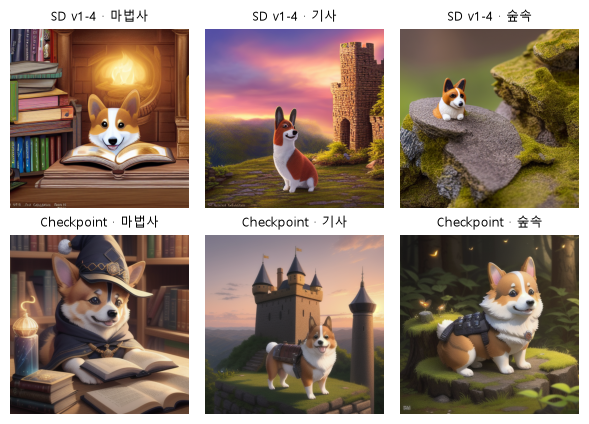

In [13]:
sd14 = load_pipe(MODEL_ID)
images_sd14 = txt2img(sd14, CORGI_PROMPTS.values())
del sd14
free_gpu()

pipe = load_pipe(CHECKPOINT)          # 첫 실행 시 Checkpoint 다운로드
images_ckpt = txt2img(pipe, CORGI_PROMPTS.values())

show_grid(images_sd14 + images_ckpt, cols=len(CORGI_PROMPTS),
          titles=[f"SD v1-4 · {k}" for k in CORGI_PROMPTS] + [f"Checkpoint · {k}" for k in CORGI_PROMPTS],
          save_path=OUT_DIR / "3-1_sd14_vs_checkpoint.jpg")

### **3-2. LoRA 덧칠하기**

**LoRA 적용 전후** — 같은 Checkpoint 에 LoRA 를 불러와 같은 노이즈로 다시 생성한다.

Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

불러온 LoRA: {'unet': ['corgi'], 'text_encoder': ['corgi']}


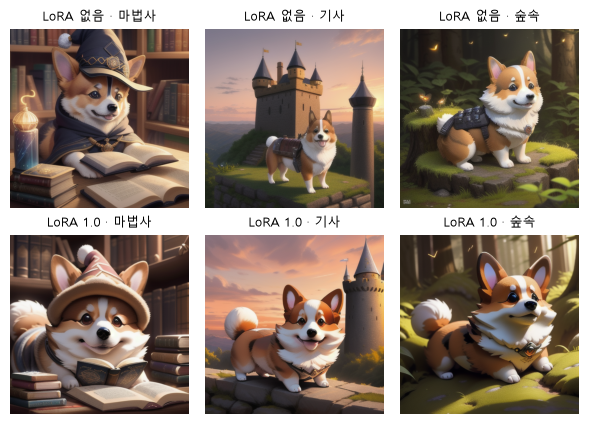

In [14]:
# [디버깅] pipe.load_lora_weights(LORA_PATH) 는 IndexError 로 실패
#   원인: transformers 5.x 에서 CLIP 텍스트 인코더 모듈 이름이 `text_model.encoder...` → `encoder...` 로 바뀌었는데,
#         diffusers 의 kohya(civitai) 형식 LoRA 변환은 여전히 `text_model.` 을 붙여 텍스트 인코더 LoRA 키가 하나도 매칭되지 않음
#   해결: 키 이름에서 `text_model.` 을 빼고, alpha 정보가 유지되도록 U-Net / 텍스트 인코더에 각각 직접 로드
def load_kohya_lora(sd_pipe, path, adapter_name):
    """kohya(civitai) 형식 LoRA 를 transformers 5.x 텍스트 인코더 구조에 맞춰 불러온다."""
    state_dict, alphas = sd_pipe.lora_state_dict(str(path))
    fix = lambda d: {k.replace("text_encoder.text_model.", "text_encoder."): v for k, v in d.items()}
    state_dict, alphas = fix(state_dict), fix(alphas or {})
    if adapter_name in sum(sd_pipe.get_list_adapters().values(), []):   # 실패한 이전 시도가 남긴 어댑터 제거
        sd_pipe.delete_adapters(adapter_name)
    sd_pipe.load_lora_into_unet(state_dict, alphas, unet=sd_pipe.unet,
                                adapter_name=adapter_name, _pipeline=sd_pipe)
    sd_pipe.load_lora_into_text_encoder(state_dict, alphas, text_encoder=sd_pipe.text_encoder,
                                        adapter_name=adapter_name, _pipeline=sd_pipe)


load_kohya_lora(pipe, LORA_PATH, "corgi")
print("불러온 LoRA:", pipe.get_list_adapters())
pipe.set_adapters(["corgi"], adapter_weights=[1.0])
images_lora = txt2img(pipe, CORGI_PROMPTS.values())

show_grid(images_ckpt + images_lora, cols=len(CORGI_PROMPTS),
          titles=[f"LoRA 없음 · {k}" for k in CORGI_PROMPTS] + [f"LoRA 1.0 · {k}" for k in CORGI_PROMPTS],
          save_path=OUT_DIR / "3-2_lora_on_off.jpg")

**LoRA scale 비교** — $\alpha$ 를 0 → 1.2 로 바꿔 덧칠 강도에 따른 변화를 확인한다.

LoRA scale:   0%|          | 0/5 [00:00<?, ?it/s]

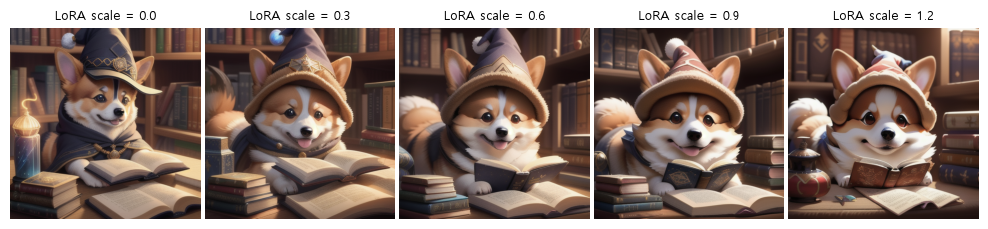

In [15]:
lora_scales = [0.0, 0.3, 0.6, 0.9, 1.2]
scale_prompt = CORGI_PROMPTS["마법사"]

images_scale = []
for s in tqdm(lora_scales, desc="LoRA scale"):
    pipe.set_adapters(["corgi"], adapter_weights=[s])
    images_scale += txt2img(pipe, [scale_prompt])

show_grid(images_scale, cols=len(lora_scales), titles=[f"LoRA scale = {s}" for s in lora_scales],
          save_path=OUT_DIR / "3-2_lora_scale.jpg")

**④ 고른 scale 로 시드 여러 개 확인** — 위 비교에서 고른 LoRA scale 로 프롬프트마다 시드 2개씩 생성합니다.

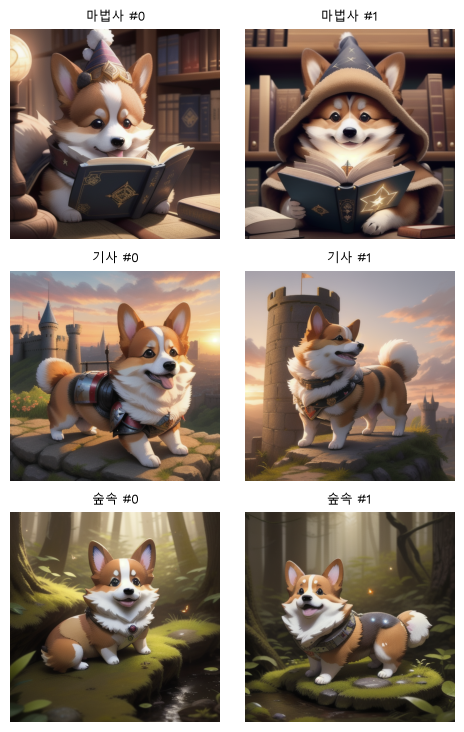

In [16]:
LORA_SCALE = 0.6
pipe.set_adapters(["corgi"], adapter_weights=[LORA_SCALE])

gallery_prompts = [p for p in CORGI_PROMPTS.values() for _ in range(2)]   # 프롬프트마다 시드 2개
images_gallery = txt2img(pipe, gallery_prompts, seed=SEED + 10, vary_noise=True)

show_grid(images_gallery, cols=2, scale=3,
          titles=[f"{k} #{i}" for k in CORGI_PROMPTS for i in range(2)],
          save_path=OUT_DIR / "3-3_gallery.jpg")

### **3-3. 나만의 취향 이미지 생성**

**Checkpoint · LoRA · 프롬프트를 원하는 이미지와 맞게 수정한다.**

**사용법**
1. **모델 셀** — Checkpoint 나 LoRA 를 바꿨을 때만 실행.
2. **생성 셀** — 프롬프트 · LoRA 세기 · 시드를 바꿔가며 **이 셀만 반복 실행**
3. 생성된 그림은 `outputs/3-3_my/` 에 저장되고, 설정은 `log.txt` 에 기록되어 마음에 든 그림을 다시 만들 수 있음.

**civitai 에서 가져오는 방법**
- 모델 페이지의 **Download** 버튼 링크 = `https://civitai.com/api/download/models/<버전ID>` → 그대로 붙여넣기 (또는 직접 받아 `weights/` 에 넣고 경로 입력)
- LoRA 페이지의 **Trigger Words** 를 프롬프트에 넣기
- 마음에 드는 예시 이미지의 **Generation data** 를 생성 셀에 옮기면 비슷하게 재현할 수 있음

In [19]:
# ── 모델 설정: 바꾼 뒤 이 셀을 다시 실행 ─────────────────────────────
MY_CHECKPOINT = CHECKPOINT      # HF 모델 ID / civitai 다운로드 URL / weights 안의 .safetensors 경로 (SD 1.5 계열)
MY_LORAS = {                    # 어댑터 이름 : civitai 다운로드 URL 또는 로컬 .safetensors 경로 (SD 1.5 용)
    "glow": "https://civitai.com/api/download/models/545423",
}
KARRAS = True                   # civitai 에서 흔한 "DPM++ 2M Karras" 샘플러


from safetensors import safe_open


def check_sd15_lora(path, name):
    """SDXL 용 LoRA(텍스트 인코더 2개)는 SD 1.5 에 넣으면 알아보기 힘든 shape 오류가 나므로 미리 막는다."""
    with safe_open(str(path), "pt") as f:
        if any(k.startswith(("lora_te1_", "lora_te2_", "text_encoder_2")) for k in f.keys()):
            raise ValueError(f"'{name}' 은 SDXL 용 LoRA 입니다. Base Model 이 SD 1.5 인 LoRA 를 골라주세요.")


free_gpu("pipe", "my_pipe")     # 비교 실험용 파이프라인 / 이전 설정 내리기

ckpt = fetch_weights(MY_CHECKPOINT) if str(MY_CHECKPOINT).startswith("http") else MY_CHECKPOINT
my_pipe = load_pipe(ckpt)
if KARRAS:
    my_pipe.scheduler = DPMSolverMultistepScheduler.from_config(my_pipe.scheduler.config, use_karras_sigmas=True)

for name, lora_src in MY_LORAS.items():
    lora_path = fetch_weights(lora_src, name)
    check_sd15_lora(lora_path, name)
    load_kohya_lora(my_pipe, lora_path, name)

print("Checkpoint :", MY_CHECKPOINT)
print("LoRA       :", my_pipe.get_list_adapters() or "없음")

GPU 사용 중 메모리: 0.01 GB


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPFeatureExtractor appears to have been deprecated in transformers. Using CLIPImageProcessor instead.


Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

Checkpoint : digiplay/hellofantasytime_v1.22
LoRA       : {'unet': ['glow'], 'text_encoder': ['glow']}


generate:   0%|          | 0/4 [00:00<?, ?it/s]

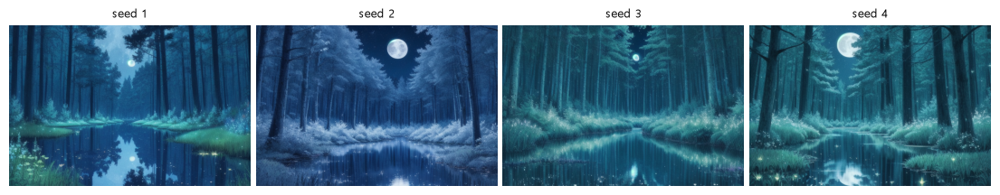

저장: outputs\3-3_my / 0922_073125_seed*.png


In [28]:
# ── 생성 설정: 프롬프트를 바꿔가며 이 셀만 반복 실행 ────────────────────
PROMPT = ("glow, night forest, dark night, calm lake in the center, tall dark trees on both sides, "
          "silver full moon in the sky, moon reflection on the water, a few small stars, "
          "many tiny fireflies among the trees, symmetrical composition, "
          "masterpiece, best quality, highly detailed")
NEGATIVE = ("worst quality, low quality, blurry, deformed, daylight, sun, sunset, orange sky, "
            "people, person, animal, building, house, boat, large glowing orbs, oversaturated, "
            "text, watermark, signature")
LORA_WEIGHTS = {"glow": 0.4}    # 제작자 권장 0.8
SEEDS = [1, 2, 3, 4]
STEPS, GUIDANCE = 28, 7.0
WIDTH, HEIGHT = 768, 512        # 풍경은 가로 그림이 잘 어울림
CLIP_SKIP = 1                   # 제작자 권장 "clip skip 2" = diffusers 에서는 1

import time

MY_DIR = OUT_DIR / "3-3_my"
MY_DIR.mkdir(exist_ok=True)

# SD 1.5 의 CLIP 은 77 토큰까지만 읽는다 (civitai 의 긴 프롬프트는 뒷부분이 잘림)
n_tokens = len(my_pipe.tokenizer(PROMPT).input_ids)
if n_tokens > my_pipe.tokenizer.model_max_length:
    print(f"⚠️ 프롬프트가 {n_tokens} 토큰 → 77 토큰 이후는 반영되지 않습니다. 중요한 단어를 앞쪽에 두세요.")

if LORA_WEIGHTS:
    my_pipe.enable_lora()
    my_pipe.set_adapters(list(LORA_WEIGHTS), adapter_weights=list(LORA_WEIGHTS.values()))
elif my_pipe.get_list_adapters():
    my_pipe.disable_lora()

@torch.no_grad()
def encode_clip_skip(sd, text, clip_skip):
    """clip_skip 을 적용한 텍스트 임베딩 (77, 768).
    diffusers 의 clip_skip 은 transformers 4.x 구조(text_encoder.text_model.final_layer_norm)를 가정해
    5.x 에서 AttributeError 가 나므로 같은 계산을 직접 한다: 뒤에서 clip_skip 층 앞의 hidden state → 마지막 LayerNorm"""
    ids = sd.tokenizer(text, padding="max_length", truncation=True,
                       max_length=sd.tokenizer.model_max_length, return_tensors="pt").input_ids.to(device)
    hidden = sd.text_encoder(ids, output_hidden_states=True).hidden_states[-(clip_skip + 1)]
    return sd.text_encoder.final_layer_norm(hidden)


# clip_skip 이 있으면 임베딩을 직접 만들어 넘기고, 없으면 파이프라인이 문장을 그대로 인코딩
if CLIP_SKIP:
    text_kwargs = dict(prompt_embeds=encode_clip_skip(my_pipe, PROMPT, CLIP_SKIP),
                       negative_prompt_embeds=encode_clip_skip(my_pipe, NEGATIVE, CLIP_SKIP))
else:
    text_kwargs = dict(prompt=PROMPT, negative_prompt=NEGATIVE)

my_images = [
    my_pipe(**text_kwargs, width=WIDTH, height=HEIGHT,
            num_inference_steps=STEPS, guidance_scale=GUIDANCE,
            generator=torch.Generator(device).manual_seed(s)).images[0]
    for s in tqdm(SEEDS, desc="generate")
]

stamp = time.strftime("%m%d_%H%M%S")
for s, img in zip(SEEDS, my_images):
    img.save(MY_DIR / f"{stamp}_seed{s}.png")
with open(MY_DIR / "log.txt", "a", encoding="utf-8") as f:   # 다시 만들 수 있도록 설정 기록
    f.write(f"[{stamp}] ckpt={MY_CHECKPOINT} lora={LORA_WEIGHTS} seeds={SEEDS} steps={STEPS} "
            f"cfg={GUIDANCE} size={WIDTH}x{HEIGHT} clip_skip={CLIP_SKIP} karras={KARRAS}\n"
            f"  + {PROMPT}\n  - {NEGATIVE}\n")

show_grid(my_images, cols=min(4, len(my_images)), scale=3.5, titles=[f"seed {s}" for s in SEEDS])
print(f"저장: {MY_DIR} / {stamp}_seed*.png")

**최종 선택**

![최종 선택](outputs/3-3_my/0922_073125_seed1.png)

- 파일: `outputs/3-3_my/0922_073125_seed1.png`
- 설정

| 항목 | 값 |
|-|-|
| Checkpoint | `digiplay/hellofantasytime_v1.22` |
| LoRA | GL0W SD 1.5 \| Brightness (civitai 545423), 세기 **0.4** |
| Prompt | `glow, night forest, dark night, calm lake in the center, tall dark trees on both sides, silver full moon in the sky, moon reflection on the water, a few small stars, many tiny fireflies among the trees, symmetrical composition, masterpiece, best quality, highly detailed` |
| Negative | `worst quality, low quality, blurry, deformed, daylight, sun, sunset, orange sky, people, person, animal, building, house, boat, large glowing orbs, oversaturated, text, watermark, signature` |
| 기타 | seed 1, DPM++ 2M Karras, 28 steps, CFG 7.0, 768×512, clip skip 2 (diffusers clip_skip=1) |

- 고른 이유: 원했던 장면(밤의 숲, 양쪽 나무, 가운데 호수, 호수에 비친 달, 작은 반딧불)이 모두 들어감. 양쪽의 나무가 호수를 감싸고, 하늘의 은빛 달이 수면에 그대로 반사됨. 차분한 분위기가 유지되고, 반딧불이 작게 여러개 있음.
- 아쉬운 점: 너무 밝아서 밤의 느낌이 부족함.

### **3-4. Checkpoint · LoRA 결과 분석**

| 관찰 항목 | 결과 |
|-|-|
| Checkpoint 효과 (SD v1-4 대비 화풍·품질) | 같은 프롬프트 · 노이즈인데 SD v1-4 는 **3D 캐릭터 · 만화풍**의 단순한 코기와 배경인 반면, `hellofantasytime` 은 **판타지 일러스트** 화풍으로 바뀜. 프롬프트의 소품이 더 정확하고 세밀하게 그려지고, 배경 묘사도 풍부해짐. Checkpoint 가 그림 전체의 **화풍과 완성도의 바탕**을 결정함을 확인 |
| LoRA 효과 (적용 전후 코기의 생김새) | 코기 LoRA 를 켜면 머리와 눈이 커지고 털이 풍성한 **귀여운 코기**로 바뀌고, 털색이 선명한 주황 · 흰색이 됨. 반면 **프롬프트의 문맥은 약해짐**: 마법사 모자가 니트 모자처럼 바뀌고, 기사는 갑옷이 거의 사라진 평범한 코기가 됨. 초기 노이즈가 같아 구도는 대체로 유지되고, **대상의 생김새 위주로 덧칠**됨 |
| LoRA scale 에 따른 변화 | **0.0**: 뾰족한 마법사 모자 + 망토 (LoRA 없음과 동일). **0.3**: 얼굴이 둥글어지고 모자가 부드러워지지만 마법사 느낌은 유지. **0.6**: LoRA 의 코기 얼굴 · 털이 분명해지고 모자는 비니에 가까워짐. **0.9 ~ 1.2**: 모자가 방울 달린 니트 모자로 바뀌어 마법사 문맥이 거의 사라지고 색이 더 진해짐 → **0.6** 이 LoRA 특징과 프롬프트 문맥의 균형점 |
| GL0W LoRA 세기 · 프롬프트 조정 (3-3) | **세기 0.8**: 물가에 **노란 빛 덩어리**가 뭉치고 달이 두 개 생기기도 함. **0.5**: 빛은 줄었지만 호숫가에 가로등 같은 주황 불빛이 남음. **negative 에 `sunset, orange sky, large glowing orbs` 추가**: 주황 불빛이 사라지고 청록 · 은빛 톤의 밤으로 바뀌었으며, LoRA 세기를 바꿨을 때보다 변화가 더 컸음. `bright lights` 제거 · `dark night` 추가는 변화가 작았음. **0.4** 에서 빛 효과가 작은 점 형태로 가장 자연스러웠음 |
| 시드의 역할 | 같은 시드는 LoRA 세기 · 프롬프트를 바꿔도 **구도(나무 배치 · 호수 모양 · 달 위치)가 거의 유지**됨 → 1장의 결과(초기 노이즈 = 구도, 텍스트 = 내용 · 분위기)와 같은 결론. 구도는 시드로 고르고 분위기는 LoRA 세기와 프롬프트로 다듬는 방식이 효과적 |
| 가장 마음에 든 조합과 이유 | `hellofantasytime` + GL0W **0.4** + seed 1 (최종 선택). 판타지 일러스트 Checkpoint 의 풍경 묘사 위에 GL0W 를 약하게 덧칠해, 빛나는 느낌은 살리면서 차분함을 유지함. 빛 효과 LoRA 는 **세기를 권장값(0.8)보다 낮추고 negative 프롬프트로 원치 않는 빛을 억제**할 때 원하는 장면에 가장 가까웠음 |

**정리**: Checkpoint 는 **화풍의 바탕**, LoRA 는 그 위에 **특정 대상 · 효과를 덧칠**하는 역할이며, LoRA 가 강할수록 프롬프트의 문맥을 덮어쓰는 경향이 있다. 원하는 이미지를 얻으려면 LoRA 세기 · negative 프롬프트 · 시드를 각각 따로 바꿔가며 효과를 확인하는 과정이 중요했다.

In [29]:
free_gpu("pipe", "my_pipe")

GPU 사용 중 메모리: 2.05 GB


## **4. 디버깅 기록 · 회고**

### **4-1. 디버깅 기록**


#### 환경 · 실행 문제

| # | 문제 | 원인 | 해결 |
|-|-|-|-|
| 1 | `torch.cuda.is_available()` 가 `False`, torch 가 `2.14.0+cpu` | 강의 노트북의 `pip install -r requirements.txt ... --upgrade` 가 torchvision 을 올리면서 **CUDA torch 를 CPU 빌드로 덮어씀** | **cu128 빌드로 재설치**. 이후 `--upgrade`, `-r requirements.txt` 사용 금지 (requirements 는 `peft==0.7.0` 으로 다운그레이드도 시킴) |
| 2 | 재설치 후 `datasets` ↔ `fsspec` 버전 충돌, `Ignoring invalid distribution ~ransformers` 경고 | `--force-reinstall` 이 fsspec 을 최신으로 올림 / 예전에 중단된 설치가 남긴 `~` 로 시작하는 임시 폴더 | `fsspec<=2026.6.0` 으로 맞춤, site-packages 의 `~*` 폴더 삭제 |
| 3 | 학습 셀 실행 30분이 지나도 **GPU 사용률 0 %, class 이미지 0 장** | 강의 노트북의 `accelerate config default` 가 **torch 가 CPU 빌드이던 시점**에 실행되어 설정 파일에 `"use_cpu": true` 가 저장됨 → `accelerate launch` 가 학습을 CPU 로 강제 | 설정 파일 삭제 후 `accelerate config default` 재생성(`use_cpu: false`). 같은 문제가 조용히 반복되지 않도록 2장 설정 셀에 CPU 모드 검사(assert) 추가. |
| 4 | 강의의 `!accelerate launch ... \` 여러 줄 명령이 Windows 에서 동작하지 않음 | Windows cmd 는 `\` 줄바꿈을 지원하지 않음 | 인자를 파이썬 리스트로 만들고 `subprocess.list2cmdline` 으로 **한 줄 명령** 생성, `sys.executable` 로 현재 conda 환경의 python 사용 |
| 5 | 노트북 파일 수정 후 `NameError: fetch_weights` | 파일의 셀 내용은 바뀌었지만 **커널에는 이전 버전이 실행된 상태** | 바뀐 함수 정의 셀을 다시 실행 |

#### 라이브러리 버전 호환 문제 (diffusers dev ↔ transformers 5.x)

| # | 문제 | 원인 | 해결 |
|-|-|-|-|
| 6 | civitai LoRA 로드 시 `IndexError: list index out of range` (`load_lora_weights`) | transformers 5.x 에서 CLIP 텍스트 인코더의 모듈 이름이 `text_model.encoder...` → `encoder...` 로 바뀌었는데, diffusers 의 kohya 형식 LoRA 변환은 여전히 `text_model.` 을 붙임 → 텍스트 인코더 LoRA 키 144개가 하나도 매칭되지 않아 rank 목록이 비어 있음 | 키 이름에서 `text_model.` 제거 + **alpha 정보가 유지되도록** U-Net / 텍스트 인코더에 각각 직접 로드하는 `load_kohya_lora()` 작성. 변환된 dict 를 `load_lora_weights` 에 넘기면 alpha 가 사라져 LoRA 가 2배 강하게 적용되는 것도 확인 |
| 7 | `clip_skip` 사용 시 `AttributeError: 'CLIPTextModel' object has no attribute 'text_model'` | 6번과 같은 원인. diffusers 가 `text_encoder.text_model.final_layer_norm` 을 찾음 | 같은 계산(뒤에서 clip_skip 층 앞의 hidden state → 마지막 LayerNorm)을 하는 `encode_clip_skip()` 을 작성해 `prompt_embeds` 로 전달. clip_skip=0 으로 계산하면 기본 출력과 일치함을 검증 |

#### 강의 코드 개선

| # | 내용 | 이유 |
|-|-|-|
| 8 | instance 원본(`instance_raw/`)과 학습 입력(`instance/`) 분리 | 학습 스크립트는 폴더의 **모든 파일**을 이미지로 열기 때문에 Windows 의 `Thumbs.db` · `desktop.ini` 가 섞이면 멈춤. 폰 사진의 EXIF 회전도 함께 보정 |
| 9 | `fetch_weights()` : 브라우저 User-Agent 로 요청, URL 의 `?type=...` 제거 | civitai 가 파이썬 기본 UA 를 막는 경우가 있고, Windows 파일명에는 `?` 를 쓸 수 없음 |
| 10 | 강의 코드의 정의되지 않은 `get_encoding` → `encode_prompt()` 로 구현, `export_as_gif` 가 원본 리스트를 바꾸는 문제 수정 | 반복 코드를 헬퍼 함수로 묶어 1~3장에서 재사용 |
| 11 | 강의 예제는 코기 LoRA 를 **트리거 단어 없이** "pink cat" 에 적용 | LoRA 효과를 확인할 수 없음 → 트리거 단어 `MG keji` 를 넣고 적용 전후 · scale 별로 비교 |

#### 결과 개선 실험

| # | 문제 | 원인 분석 | 조치 · 결과 |
|-|-|-|-|
| 12 | DreamBooth v1 이 대상을 **부분적으로만** 재현 (나비넥타이만) | SD 의 "stuffed bunny" 사전 지식(흰색·분홍 코)이 강하고 내 인형은 그와 달라 lr 2e-6 · 400 step 으로는 부족 | lr 5e-6 · 800 step 으로 재학습 → 재현 1/4 → **4/4**, drift 는 오히려 감소. 대신 학습 배경·정면 자세 반복, "우주" 문맥 무시 → **재현도 ↔ 문맥 반영의 trade-off** |
| 13 | GL0W 적용 시 노란 빛 덩어리 · 달 두 개 · 주황 불빛 | 빛 효과 LoRA 세기가 강하고, 호숫가 장면에 따라오는 조명이 억제되지 않음 | LoRA 0.8 → 0.4, negative 에 `sunset, orange sky, large glowing orbs` 추가 → **negative 조정 효과가 세기 조정보다 컸음** |

### **4-2. 회고**


#### 배운 점
- **잠재 공간의 역할 분담**: 초기 노이즈(이미지 잠재)는 구도를, 텍스트 임베딩은 내용 · 화풍 · 색감을 주로 결정한다. 1장의 보간 실험에서 확인한 이 관계가 3장에서 시드를 고정하고 LoRA · 프롬프트만 바꿀 때도 그대로 적용되었다.
- **임베딩 보간은 선형이지만 이미지 변화는 선형이 아니다**: 변화가 몇 구간에 몰리는 계단식 이었고, 중간 지점은 두 개념의 평균이 아니라 공통 요소(배경 · 조명)만 남은 장면이었다.
- **DreamBooth 의 trade-off**: 학습량을 늘리면 대상 재현도는 오르지만 문맥 반영이 떨어진다. prior preservation 은 class 지식(language drift)을 지키는 데 효과가 있었다. loss 값보다 같은 노이즈로 생성한 비교 이미지가 판단 근거로 적절했다.
- **Checkpoint 와 LoRA**: Checkpoint 는 화풍의 바탕, LoRA 는 그 위의 덧칠이다. LoRA 가 강할수록 프롬프트 문맥을 덮어쓰므로 권장값보다 약하게 설정하는 편이 좋았고, 원하지 않는 요소는 negative 프롬프트로 억제하는 것이 효과적이었다.
- **공정한 비교 설계**: 모든 비교에서 시드 · 초기 노이즈를 고정하고 한 번에 한 요인만 바꿔야 차이의 원인을 알수 있었다.

#### 아쉬운 점
- 12GB VRAM 제약으로 텍스트 인코더 학습(`--train_text_encoder`)을 시도하지 못했다. instance 사진의 배경 · 자세를 더 다양하게 찍었다면 과적합이 줄었을 것이다.
- 최종 이미지에서 **별이 거의 보이지 않았고**, 반딧불이 나무보다 수면 쪽에 모였다. 프롬프트의 단어 순서 · 가중치를 더 조정해 볼 여지가 있다.

#### 느낀 점
- 과제의 상당 시간이 모델보다 **환경 문제**(CPU torch, accelerate 설정, Windows 프로세스, 라이브러리 버전 차이)에 쓰였다. 오류 메시지만 보고 코드를 바꾸기보다, **GPU 사용률 · 프로세스 · 설정 파일 · 라이브러리 소스**를 직접 확인해 원인을 좁히는 과정이 가장 큰 공부가 되었다.
- 최신 라이브러리(diffusers dev · transformers 5.x)는 기능이 많지만 서로 맞지 않는 부분이 있었다. 문제가 생긴 부분만 우회하고, 우회한 이유를 코드 주석에 남겨 두는 습관이 중요하다고 느꼈다.
- 직접 찍은 토끼 인형이 생성 이미지에 나타나고, 원하는 밤의 숲 장면을 LoRA 세기와 프롬프트로 조금씩 다듬어 가는 과정이 재미있었다. 동시에 civitai 가중치의 라이선스, 생성 이미지의 윤리 문제도 함께 고려해야 한다는 점을 기억해야겠다.